#**Denoise images using Autoencoders**

####Problem Statement:-In the realm of digital document processing, noise often infiltrates images due to various factors such as scanning artifacts, low-quality cameras, or environmental conditions. This noise not only impedes readability but also hinders subsequent processing tasks such as optical character recognition (OCR) or document classification.

####Objective:-The objective of this project is to develop an effective solution for denoising document images using autoencoder neural networks. Autoencoders are a type of artificial neural network trained to copy their input data to the output while compressing the data representation into a lower-dimensional space. By leveraging the capabilities of autoencoders, we aim to restore clarity and remove noise from the document images, thereby enhancing their quality for downstream tasks.

##Importing  libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import cv2

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping

%matplotlib inline

## Importing Data from mouting it from drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/Denoising_data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/MyDrive/Denoising_data/denoising-dirty-documents.zip


## Unzip the data

train.zip contains the images that we will train our deep learning autoencoder on. These images contain text to which noise has been added. Our aim is to build an autoencoder neural network that will denoise those images.

 test.zip contains the images that we will use to test our neural network once it has been trained. We will try to get clean images as the output by cleaning the noise from the test images.

  train_cleaned.zip contains the same images as the train images but without the noise. We will use these images as targets to train our network. We will train our autoencoder neural network on the noisy train images. While doing so, we will try to eliminate the noise by posing the clean train image as the targets. After that, when we will feed our network with the noisy test images, we should be able to get clean images as output.

In [ ]:
!unzip "/content/drive/MyDrive/Denoising_data/denoising-dirty-documents.zip" -d "/content/denoising-dirty-documents"

Archive:  /content/drive/MyDrive/Denoising_data/denoising-dirty-documents.zip
  inflating: /content/denoising-dirty-documents/sampleSubmission.csv.zip  
  inflating: /content/denoising-dirty-documents/test.zip  
  inflating: /content/denoising-dirty-documents/train.zip  
  inflating: /content/denoising-dirty-documents/train_cleaned.zip  


In [ ]:
path_zip = '/content/denoising-dirty-documents'
path = '/content/denoising-dirty-documents/'

In [ ]:
with zipfile.ZipFile(path_zip + '/train.zip', 'r') as zip_ref:
    zip_ref.extractall(path)

with zipfile.ZipFile(path_zip + '/test.zip', 'r') as zip_ref:
    zip_ref.extractall(path)

with zipfile.ZipFile(path_zip + '/train_cleaned.zip', 'r') as zip_ref:
    zip_ref.extractall(path)



In [ ]:
# store image names in list for later use
train_img = sorted(os.listdir(path + '/train'))
train_cleaned_img = sorted(os.listdir(path + '/train_cleaned'))
test_img = sorted(os.listdir(path + '/test'))

##**Data preparation**

define function to process images and then store this images in list.

In [ ]:
# prepare function
def process_image(path):
    img = cv2.imread(path)
    img = np.asarray(img, dtype="float32")
    img = cv2.resize(img, (540, 420))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img/255.0
    img = np.reshape(img, (420, 540, 1))

    return img

Reshape images and put them into list

In [ ]:
# preprocess images
train = []
train_cleaned = []
test = []

for f in sorted(os.listdir(path + 'train/')):
    train.append(process_image(path + 'train/' + f))

for f in sorted(os.listdir(path + 'train_cleaned/')):
    train_cleaned.append(process_image(path + 'train_cleaned/' + f))

for f in sorted(os.listdir(path + 'test/')):
    test.append(process_image(path + 'test/' + f))

##Exploratory data analysis

 look on train images and their cleaned version

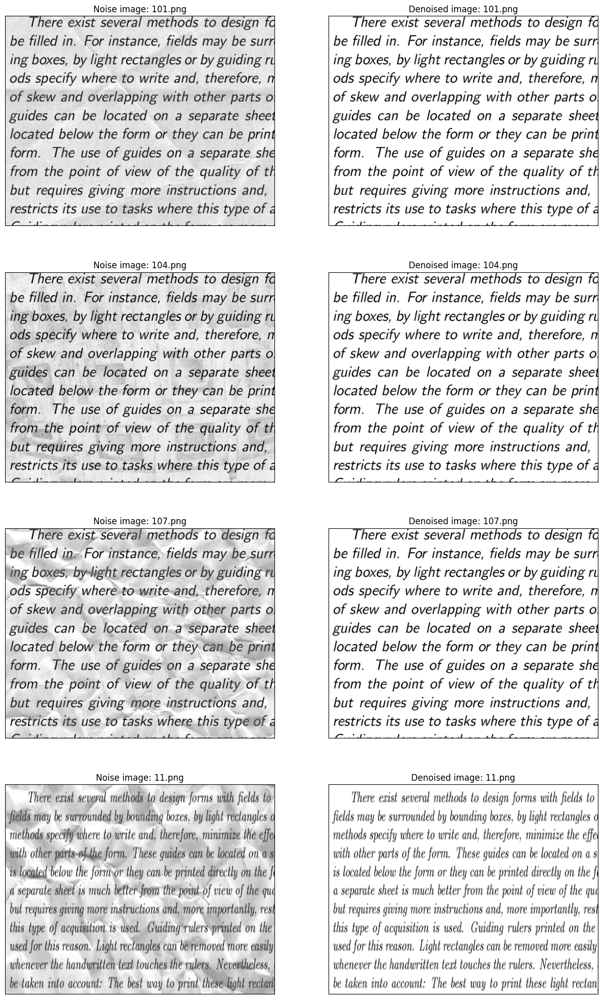

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

##**Split data**
In this step we convert lists to numpy arrays and split dataset into train and validation in ration 85% train, 15% test.

In [ ]:
# convert list to numpy array
X_train = np.asarray(train)
Y_train = np.asarray(train_cleaned)
X_test = np.asarray(test)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.15)

In [ ]:
print(len(X_train))
print(len(Y_train))
print(len(X_test))
print(X_train[1])

122
122
72
[[[0.83137256]
  [0.81960785]
  [0.8117648 ]
  ...
  [0.8117648 ]
  [0.7882353 ]
  [0.78431374]]

 [[0.83633053]
  [0.8245658 ]
  [0.8233334 ]
  ...
  [0.81507   ]
  [0.78988796]
  [0.787619  ]]

 [[0.84271705]
  [0.8317927 ]
  [0.8392157 ]
  ...
  [0.81848735]
  [0.79285717]
  [0.792577  ]]

 ...

 [[0.78795516]
  [0.78795516]
  [0.74439776]
  ...
  [0.86610645]
  [0.84327734]
  [0.8228291 ]]

 [[0.7678152 ]
  [0.7610084 ]
  [0.7360224 ]
  ...
  [0.86212885]
  [0.8340617 ]
  [0.8121849 ]]

 [[0.7529412 ]
  [0.7411765 ]
  [0.7294118 ]
  ...
  [0.8588236 ]
  [0.827451  ]
  [0.8039216 ]]]


##**Modeling**

In [ ]:
def model():
    input_layer = Input(shape=(420, 540, 1))  # we might define (None,None,1) here, but in model summary dims would not be visible

    # encoding
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Dropout(0.5)(x)

    # decoding
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = UpSampling2D((2, 2))(x)

    output_layer = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    model = Model(inputs=[input_layer], outputs=[output_layer])
    model.compile(optimizer='adam' , loss='mean_squared_error', metrics=['mae'])

    return model


model = model()
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_11 (Conv2D)          (None, 420, 540, 64)      640       
                                                                 
 conv2d_12 (Conv2D)          (None, 420, 540, 128)     73856     
                                                                 
 batch_normalization_2 (Bat  (None, 420, 540, 128)     512       
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 210, 270, 128)     0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 210, 270, 128)     0   

In [ ]:
#model1
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization
from tensorflow.keras.models import Model

def optimized_autoencoder():
    # Input layer
    input_layer = Input(shape=(420, 540, 1))

    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    # Output layer
    output_layer = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Create the model
    models = Model(inputs=input_layer, outputs=output_layer)
    models.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

    return models

# Instantiate the model
autoencoder = optimized_autoencoder()

# Display model summary
autoencoder.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_17 (Conv2D)          (None, 420, 540, 32)      320       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 210, 270, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 210, 270, 32)      9248      
                                                                 
 up_sampling2d_4 (UpSamplin  (None, 420, 540, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 420, 540, 1)       289 

In [ ]:
callback = EarlyStopping(monitor='loss', patience=12)
history =autoencoder.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=20, batch_size=12, verbose=0, callbacks=[callback])

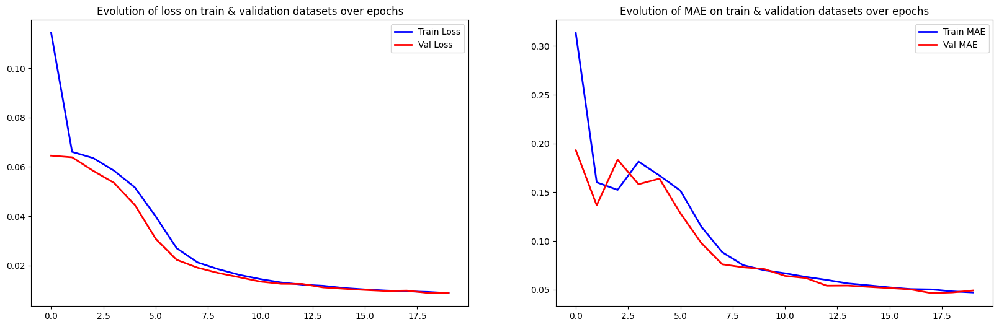

In [ ]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [ ]:
Y_test = autoencoder.predict(X_test, batch_size=16)

5/5 [==============================] - 8s 2s/step


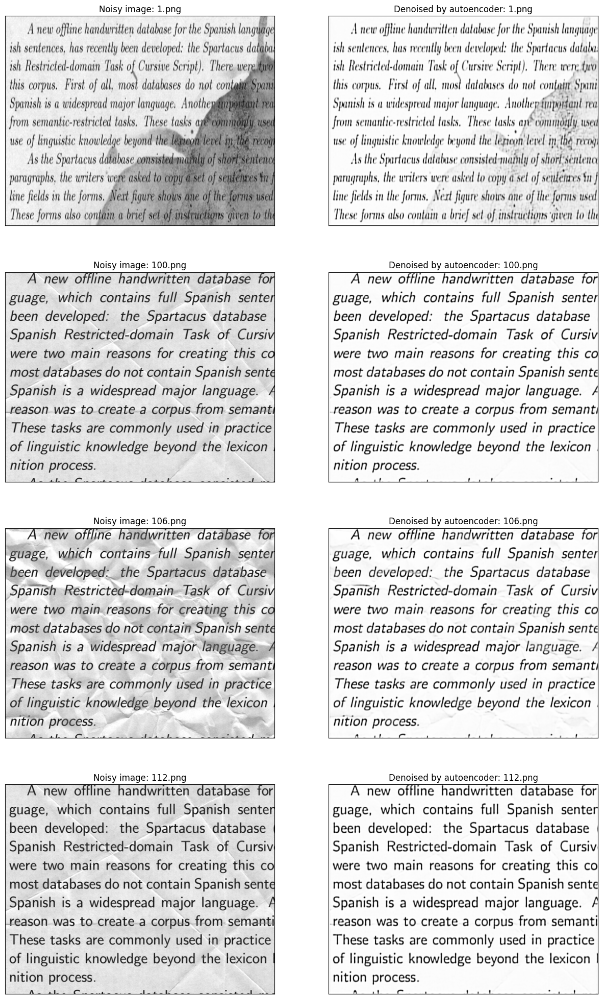

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by autoencoder: {}'.format(test_img[i]))

plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error

Y_test_flat = Y_test.flatten()
Y_val_flat = Y_val.flatten()

mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])
print("Mean Squared Error (MSE):", mse)

Mean Squared Error (MSE): 0.11869055


In [ ]:
mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])

threshold = 0.9

accurate_pixels = np.sum(np.abs(Y_val_flat - Y_test_flat[0:4989600]) < threshold)

total_pixels = Y_val_flat.shape[0]
accuracy = accurate_pixels / total_pixels

print("Accuracy:", accuracy)

Accuracy: 0.9509976751643419


In [ ]:
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Model
#model2
def basic_autoencoder():
    # Input layer
    input_layer = Input(shape=(420, 540, 1))

    # Encoder
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_layer)

    # Decoder
    decoded = Conv2DTranspose(1, (3, 3), activation='sigmoid', padding='same')(x)

    # Create the model
    model = Model(inputs=input_layer, outputs=decoded)
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

    return model

# Instantiate the model
autoencoders = basic_autoencoder()

# Display model summary
autoencoders.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_16 (Conv2D)          (None, 420, 540, 16)      160       
                                                                 
 conv2d_transpose (Conv2DTr  (None, 420, 540, 1)       145       
 anspose)                                                        
                                                                 
Total params: 305 (1.19 KB)
Trainable params: 305 (1.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
callback = EarlyStopping(monitor='loss', patience=12)
history = autoencoders.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=50, batch_size=12, verbose=0, callbacks=[callback])

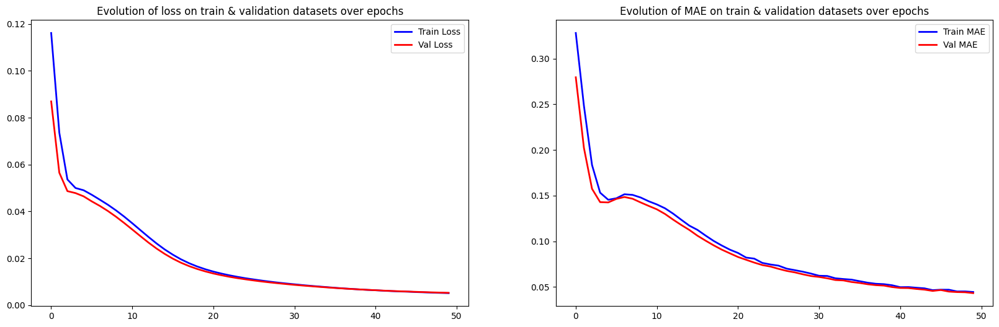

In [ ]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [ ]:
Y_test = autoencoders.predict(X_test, batch_size=12)

6/6 [==============================] - 4s 511ms/step


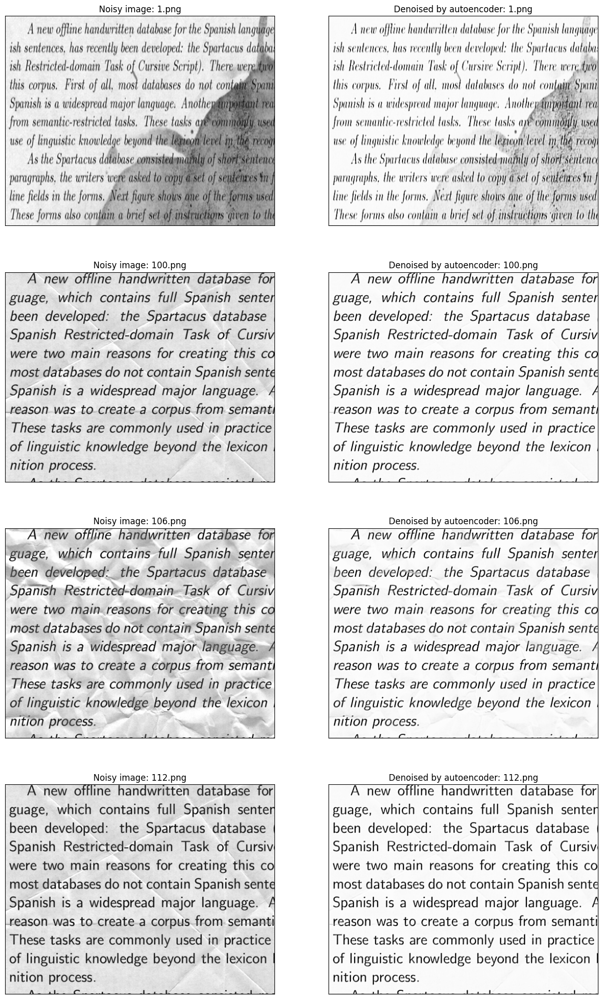

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by autoencoder: {}'.format(test_img[i]))

plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error

Y_test_flat = Y_test.flatten()
Y_val_flat = Y_val.flatten()

mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])
print("Mean Squared Error (MSE):", mse)

Mean Squared Error (MSE): 0.11595936


In [ ]:
mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])

threshold = 0.9

accurate_pixels = np.sum(np.abs(Y_val_flat - Y_test_flat[0:4989600]) < threshold)

total_pixels = Y_val_flat.shape[0]
accuracy = accurate_pixels / total_pixels

print("Accuracy:", accuracy)

Accuracy: 0.946063011063011


In [ ]:
#model 4
def model():
    input_layer = Input(shape=(420, 540, 1))  # we might define (None,None,1) here, but in model summary dims would not be visible

    # encoding
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Dropout(0.5)(x)

    # decoding
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = UpSampling2D((2, 2))(x)

    output_layer = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    model = Model(inputs=[input_layer], outputs=[output_layer])
    model.compile(optimizer='adam' , loss='mean_squared_error', metrics=['mae'])

    return model


model = model()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 420, 540, 64)      640       
                                                                 
 conv2d_6 (Conv2D)           (None, 420, 540, 128)     73856     
                                                                 
 batch_normalization (Batch  (None, 420, 540, 128)     512       
 Normalization)                                                  
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 210, 270, 128)     0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 210, 270, 128)     0     

In [ ]:
callback = EarlyStopping(monitor='loss', patience=20)
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=200, batch_size=8, verbose=0, callbacks=[callback])

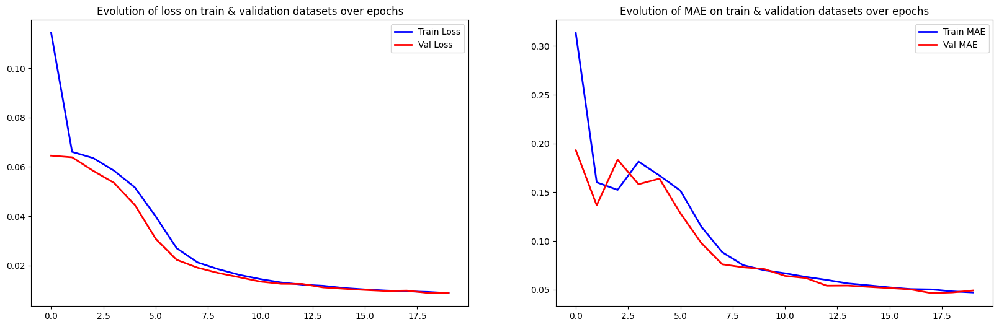

In [ ]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [ ]:
Y_test = model.predict(X_test, batch_size=16)

11/11 [==============================] - 6s 104ms/step


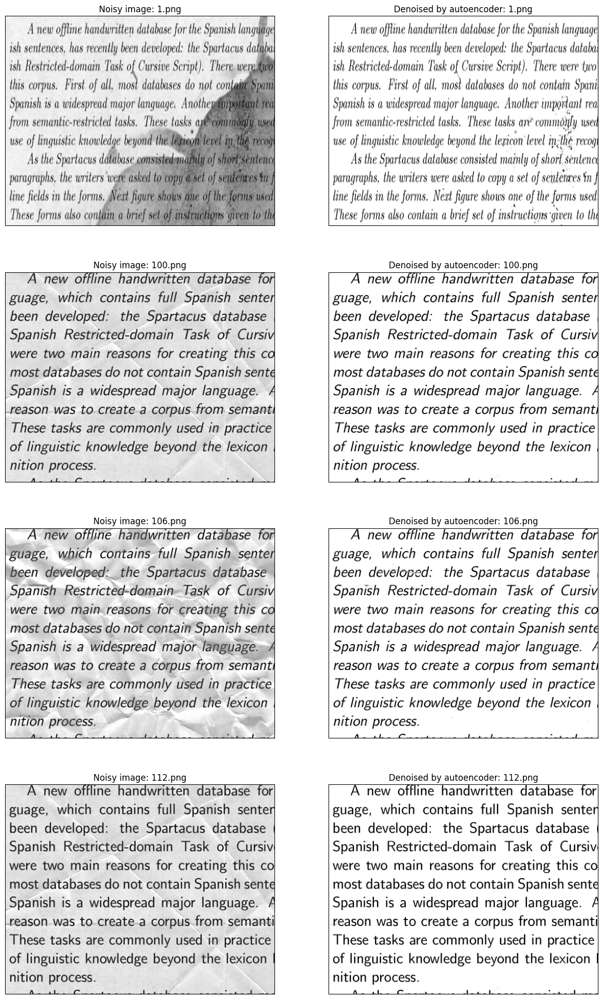

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by autoencoder: {}'.format(test_img[i]))

plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error

Y_test_flat = Y_test.flatten()
Y_val_flat = Y_val.flatten()

mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])
print("Mean Squared Error (MSE):", mse)

In [ ]:
mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])

threshold = 0.9

accurate_pixels = np.sum(np.abs(Y_val_flat - Y_test_flat[0:4989600]) < threshold)

total_pixels = Y_val_flat.shape[0]
accuracy = accurate_pixels / total_pixels

print("Accuracy:", accuracy)

Sequential Modeling

In [ ]:
#model3
import tensorflow as tf
import keras
from keras import layers

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding
from keras.layers import SpatialDropout1D, Conv2D, MaxPooling2D, UpSampling2D

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout

def create_autoencoder():
    model_1 = Sequential()

    # Encoding layers
    model_1.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(420, 540, 1)))
    model_1.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model_1.add(MaxPooling2D((2, 2), padding='same'))
    model_1.add(Dropout(0.5))

    # Decoding layers
    model_1.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model_1.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model_1.add(UpSampling2D((2, 2)))

    # Output layer
    model_1.add(Conv2D(1, (3, 3), activation='sigmoid', padding='same'))

    return model_1

model_1 = create_autoencoder()
model_1.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

model_1.summary()




Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 420, 540, 64)      640       
                                                                 
 conv2d_11 (Conv2D)          (None, 420, 540, 128)     73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 210, 270, 128)     0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 210, 270, 128)     0         
                                                                 
 conv2d_12 (Conv2D)          (None, 210, 270, 128)     147584    
                                                                 
 conv2d_13 (Conv2D)          (None, 210, 270, 64)      73792     
                                                      

In [ ]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(420, 540, 3,)))
model.add(MaxPooling2D((2, 2), padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2), padding='same'))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))

model.summary()

model.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=["accuracy"])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 420, 540, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 210, 270, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 210, 270, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 105, 135, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 105, 135, 32)      9248      
                                                                 
 up_sampling2d (UpSampling2  (None, 210, 270, 32)      0

In [ ]:

model = keras.Sequential()
model.add(keras.Input(shape=(16,)))
model.add(keras.layers.Dense(8))

# Note that you can also omit the initial `Input`.
# In that case the model doesn't have any weights until the first call
# to a training/evaluation method (since it isn't yet built):
model = keras.Sequential()
model.add(keras.layers.Dense(8))
model.add(keras.layers.Dense(4))
# model.weights not created yet

# Whereas if you specify an `Input`, the model gets built
# continuously as you are adding layers:
model = keras.Sequential()
model.add(keras.Input(shape=(16,)))
model.add(keras.layers.Dense(8))
len(model.weights)  # Returns "2"

# When using the delayed-build pattern (no input shape specified), you can
# choose to manually build your model by calling
# `build(batch_input_shape)`:
model = keras.Sequential()
model.add(keras.layers.Dense(8))
model.add(keras.layers.Dense(4))
model.build((None, 16))
len(model.weights)  # Returns "4"

# Note that when using the delayed-build pattern (no input shape specified),
# the model gets built the first time you call `fit`, `eval`, or `predict`,
# or the first time you call the model on some input data.
model = keras.Sequential()
model.add(keras.layers.Dense(8))
model.add(keras.layers.Dense(1))
model.compile(optimizer='sgd', loss='mse')
# This builds the model for the first time:
model.fit(X_train, Y_train, batch_size=32, epochs=10)

Epoch 1/10
4/4 [==============================] - 5s 749ms/step - loss: 0.0442
Epoch 2/10
4/4 [==============================] - 3s 790ms/step - loss: 0.0218
Epoch 3/10
4/4 [==============================] - 5s 1s/step - loss: 0.0138
Epoch 4/10
4/4 [==============================] - 3s 754ms/step - loss: 0.0110
Epoch 5/10
4/4 [==============================] - 3s 764ms/step - loss: 0.0100
Epoch 6/10
4/4 [==============================] - 3s 725ms/step - loss: 0.0097
Epoch 7/10
4/4 [==============================] - 4s 1s/step - loss: 0.0095
Epoch 8/10
4/4 [==============================] - 4s 804ms/step - loss: 0.0095
Epoch 9/10
4/4 [==============================] - 3s 746ms/step - loss: 0.0095
Epoch 10/10
4/4 [==============================] - 3s 731ms/step - loss: 0.0094


In [ ]:
callback = EarlyStopping(monitor='loss', patience=20)
history_2 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=300, batch_size=8, verbose=0, callbacks=[callback])

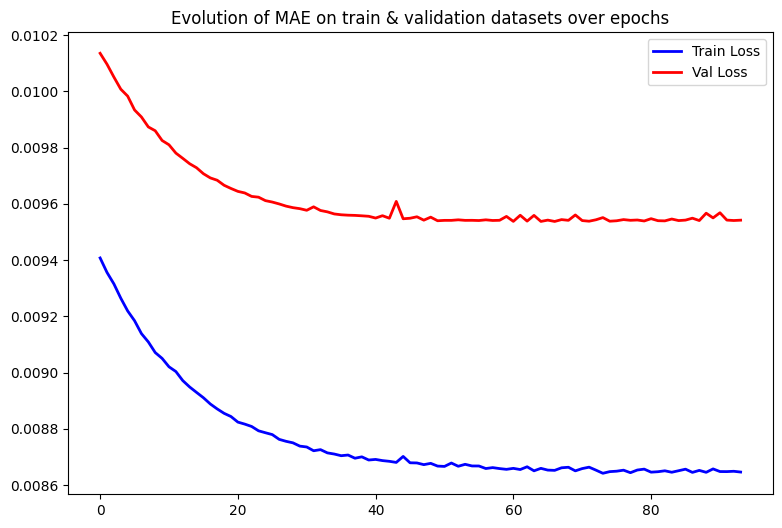

In [ ]:
# Check how loss & mae went down
epoch_loss = history_2.history['loss']
epoch_val_loss = history_2.history['val_loss']


plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')
plt.show()

In [ ]:
Y_test = model.predict(X_test, batch_size=16)

5/5 [==============================] - 3s 448ms/step


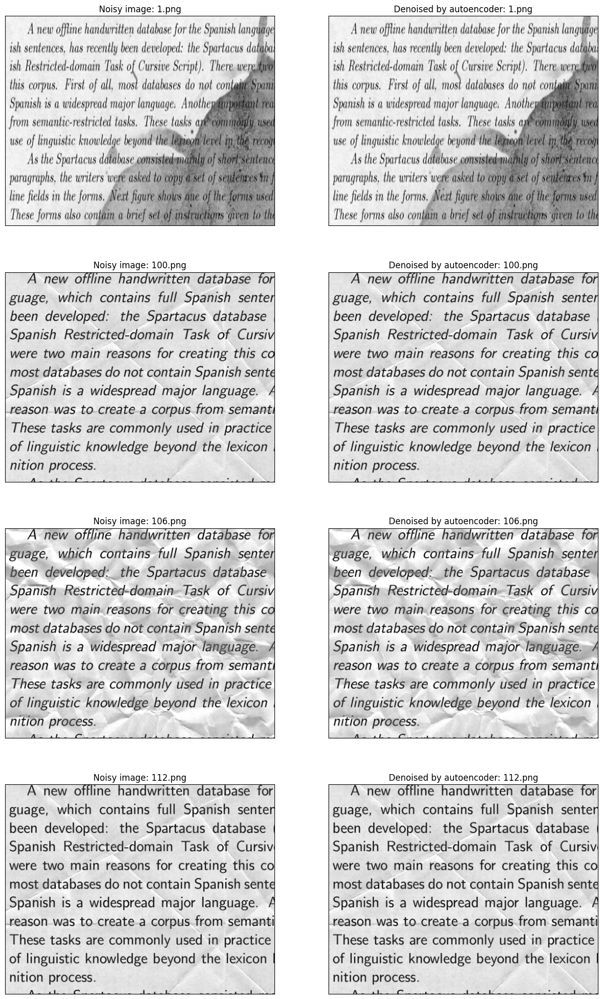

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by autoencoder: {}'.format(test_img[i]))

plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error

Y_test_flat = Y_test.flatten()
Y_val_flat = Y_val.flatten()

mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])
print("Mean Squared Error (MSE):", mse)

Mean Squared Error (MSE): 0.12627289


In [ ]:
mse = mean_squared_error(Y_val_flat, Y_test_flat[0:4989600])

threshold = 0.9

accurate_pixels = np.sum(np.abs(Y_val_flat - Y_test_flat[0:4989600]) < threshold)

total_pixels = Y_val_flat.shape[0]
accuracy = accurate_pixels / total_pixels

print("Accuracy:", accuracy)

Accuracy: 0.955918911335578
